In [ ]:
import numpy as np
import os
import matplotlib.pyplot as plt
import os, random
import pillow_heif
from PIL import Image, ImageChops, ImageEnhance, ImageFilter
import matplotlib.pyplot as plt

In [ ]:
day = r'D:\KULIAH\SEMESTER 5\DEEP LEARNING\PROJECT\DATASET\DATA SEKUNDER\Day'
night = r'D:\KULIAH\SEMESTER 5\DEEP LEARNING\PROJECT\DATASET\DATA SEKUNDER\Night'

In [ ]:
def show_image(input_dir, title=""):
    file_list = [f for f in os.listdir(input_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))][:20]
    plt.figure(figsize=(20, 5))
    for i, file_name in enumerate(file_list):
        img_path = os.path.join(input_dir, file_name)
        with Image.open(img_path) as img:
            plt.subplot(2, 10, i + 1)
            plt.imshow(img)
            plt.axis('off')

    plt.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.show()

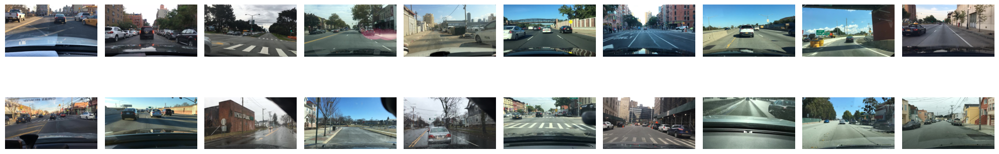

In [ ]:
show_image(day)

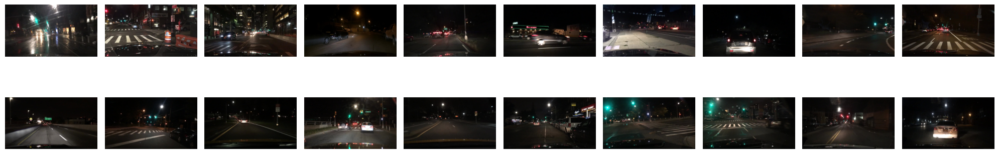

In [ ]:
show_image(night)

In [ ]:
day_Resized = r'D:\KULIAH\SEMESTER 5\DEEP LEARNING\PROJECT\DATASET\DATA SEKUNDER\Resized\Day'
night_Resized = r'D:\KULIAH\SEMESTER 5\DEEP LEARNING\PROJECT\DATASET\DATA SEKUNDER\Resized\Night'

os.makedirs(day_Resized, exist_ok=True)
os.makedirs(night_Resized, exist_ok=True)

def resize_images(input_dir, output_dir, size=(256, 256)):
    for filename in os.listdir(input_dir):
        if filename.lower().endswith(('.jpg', '.jpeg', '.png')):
            img_path = os.path.join(input_dir, filename)
            try:
                img = Image.open(img_path)
                img_resized = img.resize(size)
                save_path = os.path.join(output_dir, filename)
                img_resized.save(save_path)
            except Exception as e:
                print(f"Gagal memproses {filename}: {e}")

resize_images(day, day_Resized)
resize_images(night, night_Resized)

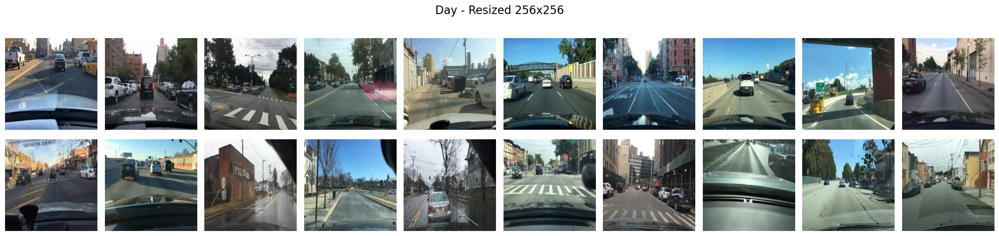

In [ ]:
show_image(day_Resized, title="Day - Resized 256x256")

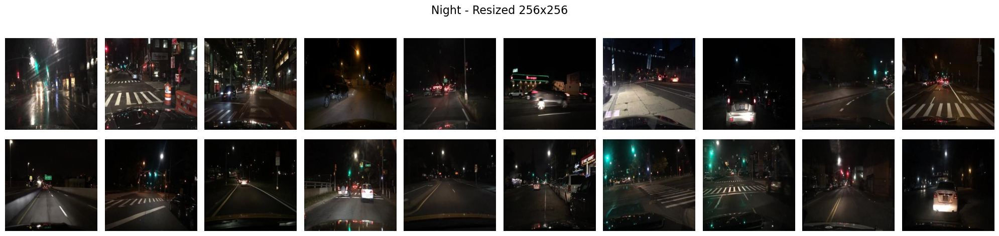

In [ ]:
show_image(night_Resized, title="Night - Resized 256x256")

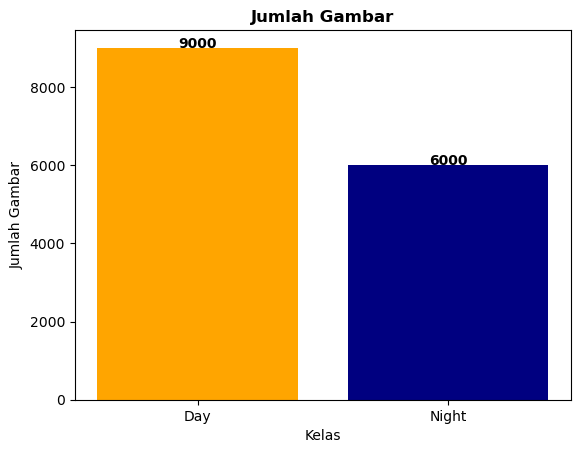

In [ ]:
num_day = len([f for f in os.listdir(day_Resized) if f.lower().endswith(('jpg', 'jpeg', 'png'))])
num_night = len([f for f in os.listdir(night_Resized) if f.lower().endswith(('jpg', 'jpeg', 'png'))])

labels = ["Day", "Night"]
values = [num_day, num_night]
colors = ["orange", "navy"]

plt.bar(labels, values, color=colors)

for i, v in enumerate(values):
    plt.text(i, v + 2, str(v), ha='center', fontweight='bold', fontsize=10, color='black')

plt.title("Jumlah Gambar", fontsize=12, fontweight='bold')
plt.ylabel("Jumlah Gambar")
plt.xlabel("Kelas")
plt.show()

In [ ]:
def visualize_RGB_distribution(image_path, title):
    img = np.array(Image.open(image_path).convert('RGB'))
    img = (img / 255.0)

    colors = ['red', 'green', 'blue']
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 4, 1)
    plt.imshow(img)
    plt.title(title)
    plt.axis("off")

    for i, color in enumerate(colors):
        plt.subplot(1, 4, i + 2)
        plt.hist((img[:, :, i] * 255).flatten(), bins=50, color=color, alpha=0.7)
        plt.title(f"{color.capitalize()} Channel")

    plt.tight_layout()
    plt.show()

day_sample = os.path.join(day_Resized, os.listdir(day_Resized)[0])
night_sample = os.path.join(night_Resized, os.listdir(night_Resized)[0])

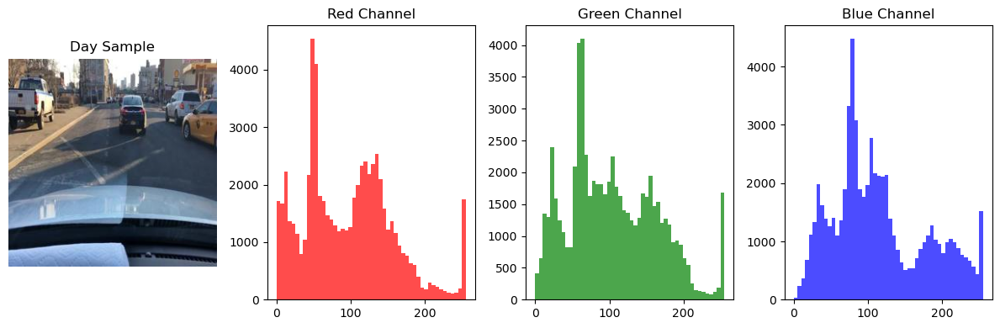

In [ ]:
visualize_RGB_distribution(day_sample, "Day Sample")

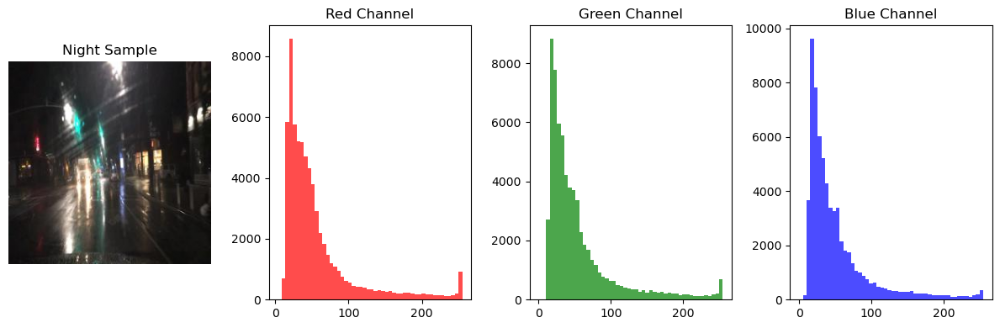

In [ ]:
visualize_RGB_distribution(night_sample, "Night Sample")

In [ ]:
def shift_image(image, dx, dy):
    return ImageChops.offset(image, dx, dy)

def prepare_output_dir(output_dir):
    os.makedirs(output_dir, exist_ok=True)

In [ ]:
def augmentasi_rotate_kiri(input_dir, output_dir):
    prepare_output_dir(output_dir)
    for file_name in os.listdir(input_dir):
        if file_name.lower().endswith(('.jpg', '.jpeg', '.png')):
            img_path = os.path.join(input_dir, file_name)
            with Image.open(img_path) as img:
                img = img.resize((256, 256))
                rotated = img.rotate(90, expand=True)
                base_name, ext = os.path.splitext(file_name)
                rotated.save(os.path.join(output_dir, f"{base_name}_rotate_left{ext}"))

def augmentasi_rotate_kanan(input_dir, output_dir):
    prepare_output_dir(output_dir)
    for file_name in os.listdir(input_dir):
        if file_name.lower().endswith(('.jpg', '.jpeg', '.png')):
            img_path = os.path.join(input_dir, file_name)
            with Image.open(img_path) as img:
                img = img.resize((256, 256))
                rotated = img.rotate(-90, expand=True)
                base_name, ext = os.path.splitext(file_name)
                rotated.save(os.path.join(output_dir, f"{base_name}_rotate_right{ext}"))

def augmentasi_flip_vertikal(input_dir, output_dir):
    prepare_output_dir(output_dir)
    for file_name in os.listdir(input_dir):
        if file_name.lower().endswith(('.jpg', '.jpeg', '.png')):
            img_path = os.path.join(input_dir, file_name)
            with Image.open(img_path) as img:
                img = img.resize((256, 256))
                flipped = img.transpose(Image.FLIP_TOP_BOTTOM)
                base_name, ext = os.path.splitext(file_name)
                flipped.save(os.path.join(output_dir, f"{base_name}_flip_vertikal{ext}"))

def augmentasi_flip_horizontal(input_dir, output_dir):
    prepare_output_dir(output_dir)
    for file_name in os.listdir(input_dir):
        if file_name.lower().endswith(('.jpg', '.jpeg', '.png')):
            img_path = os.path.join(input_dir, file_name)
            with Image.open(img_path) as img:
                img = img.resize((256, 256))
                flipped = img.transpose(Image.FLIP_LEFT_RIGHT)
                base_name, ext = os.path.splitext(file_name)
                flipped.save(os.path.join(output_dir, f"{base_name}_flip_horizontal{ext}"))

def augmentasi_shift(input_dir, output_dir, max_shift=20):
    prepare_output_dir(output_dir)
    for file_name in os.listdir(input_dir):
        if file_name.lower().endswith(('.jpg', '.jpeg', '.png')):
            img_path = os.path.join(input_dir, file_name)
            with Image.open(img_path) as img:
                img = img.resize((256, 256))
                dx = random.randint(-max_shift, max_shift)
                dy = random.randint(-max_shift, max_shift)
                shifted = shift_image(img, dx, dy)
                base_name, ext = os.path.splitext(file_name)
                shifted.save(os.path.join(output_dir, f"{base_name}_shift_{dx}_{dy}{ext}"))

def augmentasi_brightness(input_dir, output_dir, factors=[0.5, 1.5]):
    prepare_output_dir(output_dir)
    for file_name in os.listdir(input_dir):
        if file_name.lower().endswith(('.jpg', '.jpeg', '.png')):
            img_path = os.path.join(input_dir, file_name)
            with Image.open(img_path) as img:
                img = img.resize((256, 256))
                for factor in factors:
                    enhancer = ImageEnhance.Brightness(img)
                    bright_img = enhancer.enhance(factor)
                    base_name, ext = os.path.splitext(file_name)
                    bright_img.save(os.path.join(output_dir, f"{base_name}_brightness_{factor}{ext}"))

def augmentasi_contrast(input_dir, output_dir, factors=[0.5, 1.5]):
    prepare_output_dir(output_dir)
    for file_name in os.listdir(input_dir):
        if file_name.lower().endswith(('.jpg', '.jpeg', '.png')):
            img_path = os.path.join(input_dir, file_name)
            with Image.open(img_path) as img:
                img = img.resize((256, 256))
                for factor in factors:
                    enhancer = ImageEnhance.Contrast(img)
                    contrast_img = enhancer.enhance(factor)
                    base_name, ext = os.path.splitext(file_name)
                    contrast_img.save(os.path.join(output_dir, f"{base_name}_contrast_{factor}{ext}"))

def augmentasi_blur(input_dir, output_dir, radius_list=[1, 2]):
    prepare_output_dir(output_dir)
    for file_name in os.listdir(input_dir):
        if file_name.lower().endswith(('.jpg', '.jpeg', '.png')):
            img_path = os.path.join(input_dir, file_name)
            with Image.open(img_path) as img:
                img = img.resize((256, 256))
                for radius in radius_list:
                    blurred = img.filter(ImageFilter.GaussianBlur(radius=radius))
                    base_name, ext = os.path.splitext(file_name)
                    blurred.save(os.path.join(output_dir, f"{base_name}_blur_{radius}{ext}"))

def augmentasi_rotate_random(input_dir, output_dir, angle_range=(-15, 15)):
    prepare_output_dir(output_dir)
    for file_name in os.listdir(input_dir):
        if file_name.lower().endswith(('.jpg', '.jpeg', '.png')):
            img_path = os.path.join(input_dir, file_name)
            with Image.open(img_path) as img:
                img = img.resize((256, 256))
                angle = random.uniform(angle_range[0], angle_range[1])
                rotated = img.rotate(angle, expand=True)
                base_name, ext = os.path.splitext(file_name)
                rotated.save(os.path.join(output_dir, f"{base_name}_rotate_random_{int(angle)}{ext}"))

def augmentasi_shear(input_dir, output_dir, shear_factor=0.2):
    prepare_output_dir(output_dir)
    for file_name in os.listdir(input_dir):
        if file_name.lower().endswith(('.jpg', '.jpeg', '.png')):
            img_path = os.path.join(input_dir, file_name)
            with Image.open(img_path) as img:
                img = img.resize((256, 256))
                width, height = img.size
                matrix = (1, shear_factor, 0, 0, 1, 0)
                sheared = img.transform((width, height), Image.AFFINE, matrix)
                base_name, ext = os.path.splitext(file_name)
                sheared.save(os.path.join(output_dir, f"{base_name}_shear_{shear_factor}{ext}"))

output_day_aug = r'D:\KULIAH\SEMESTER 5\DEEP LEARNING\PROJECT\DATASET\DATASET ( 3 )\Resized_Augment\Day'
output_night_aug = r'D:\KULIAH\SEMESTER 5\DEEP LEARNING\PROJECT\DATASET\DATASET ( 3 )\Resized_Augment\Night'

augmentasi_rotate_kiri(day_Resized, output_day_aug)
augmentasi_rotate_kanan(day_Resized, output_day_aug)
augmentasi_flip_vertikal(day_Resized, output_day_aug)
augmentasi_flip_horizontal(day_Resized, output_day_aug)
augmentasi_shift(day_Resized, output_day_aug)
augmentasi_brightness(day_Resized, output_day_aug)
augmentasi_contrast(day_Resized, output_day_aug)
augmentasi_blur(day_Resized, output_day_aug)
augmentasi_rotate_random(day_Resized, output_day_aug)
augmentasi_shear(day_Resized, output_day_aug)

augmentasi_rotate_kiri(night_Resized, output_night_aug)
augmentasi_rotate_kanan(night_Resized, output_night_aug)
augmentasi_flip_vertikal(night_Resized, output_night_aug)
augmentasi_flip_horizontal(night_Resized, output_night_aug)
augmentasi_shift(night_Resized, output_night_aug)
augmentasi_brightness(night_Resized, output_night_aug)
augmentasi_contrast(night_Resized, output_night_aug)
augmentasi_blur(night_Resized, output_night_aug)
augmentasi_rotate_random(night_Resized, output_night_aug)
augmentasi_shear(night_Resized, output_night_aug)

In [ ]:
def visualize_augmentations(output_dir, augmentation_type, num_samples=5):
    augmented_files = [
        f for f in os.listdir(output_dir)
        if augmentation_type.lower() in f.lower() and f.lower().endswith(('.jpg', '.jpeg', '.png'))
    ]

    samples_to_display = random.sample(augmented_files, min(num_samples, len(augmented_files)))

    plt.figure(figsize=(15, 5))
    plt.suptitle(f"Augmentation : {augmentation_type.replace('_', ' ').title()}\nFolder: {os.path.basename(output_dir)}", fontsize=16)

    for i, file_name in enumerate(samples_to_display):
        img_path = os.path.join(output_dir, file_name)
        with Image.open(img_path) as img:
            plt.subplot(1, num_samples, i + 1)
            plt.imshow(img)
            plt.axis('off')
            plt.title(file_name[:20], fontsize=8)

    plt.tight_layout(rect=[0, 0.03, 1, 0.9])
    plt.show()

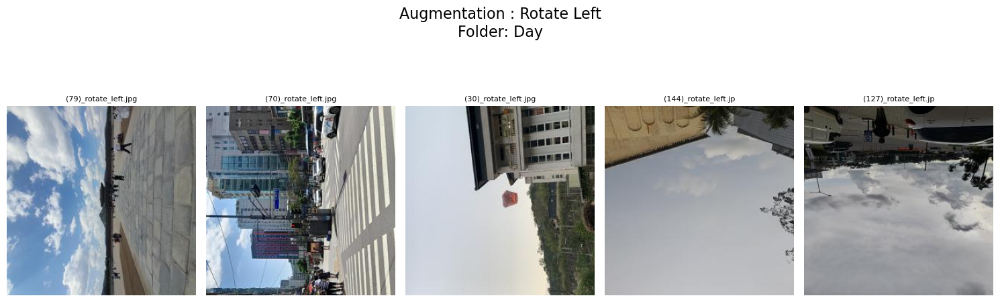

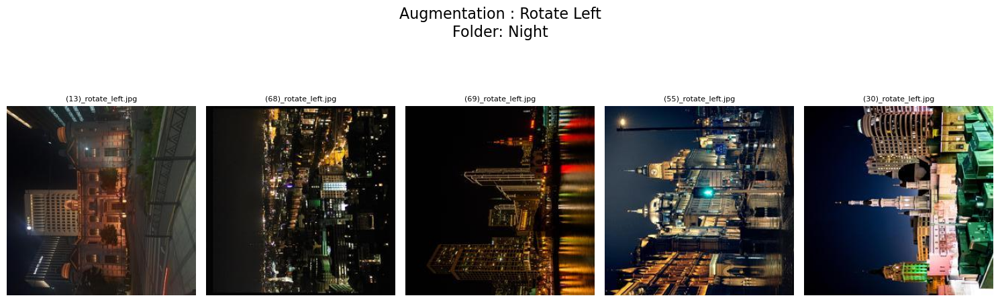

In [ ]:
visualize_augmentations(output_day_aug, "rotate_left", num_samples=5)
visualize_augmentations(output_night_aug, "rotate_left", num_samples=5)

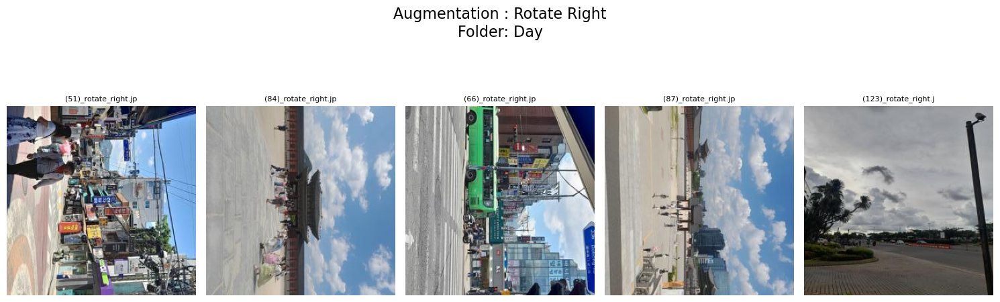

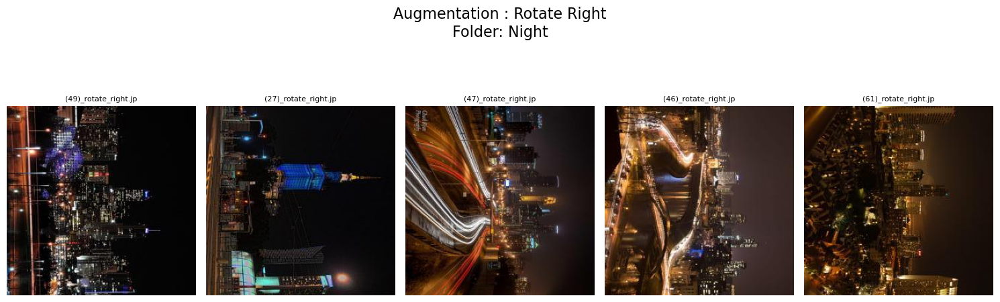

In [ ]:
visualize_augmentations(output_day_aug, "rotate_right", num_samples=5)
visualize_augmentations(output_night_aug, "rotate_right", num_samples=5)

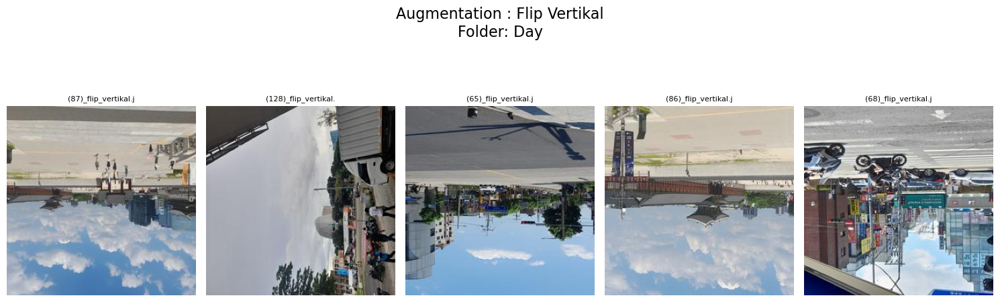

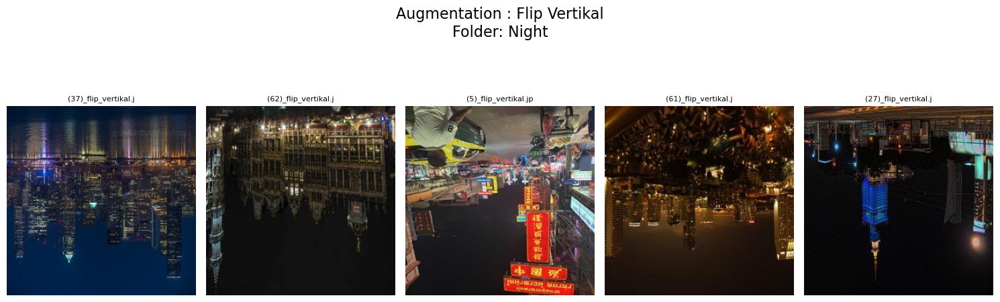

In [ ]:
visualize_augmentations(output_day_aug, "flip_vertikal", num_samples=5)
visualize_augmentations(output_night_aug, "flip_vertikal", num_samples=5)

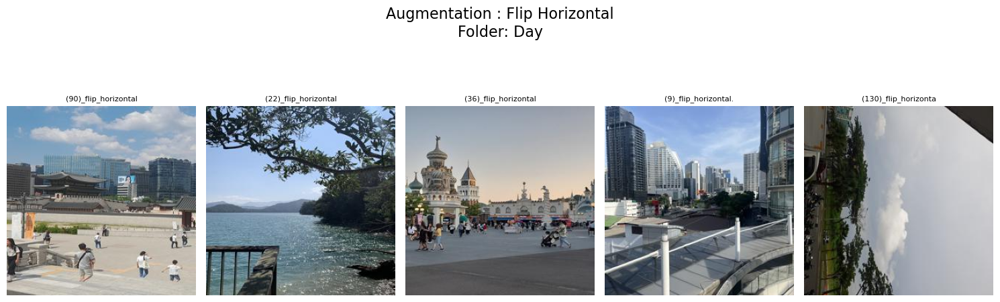

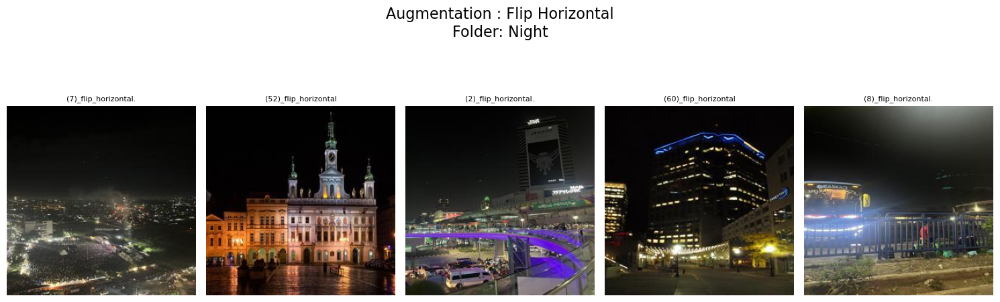

In [ ]:
visualize_augmentations(output_day_aug, "flip_horizontal", num_samples=5)
visualize_augmentations(output_night_aug, "flip_horizontal", num_samples=5)

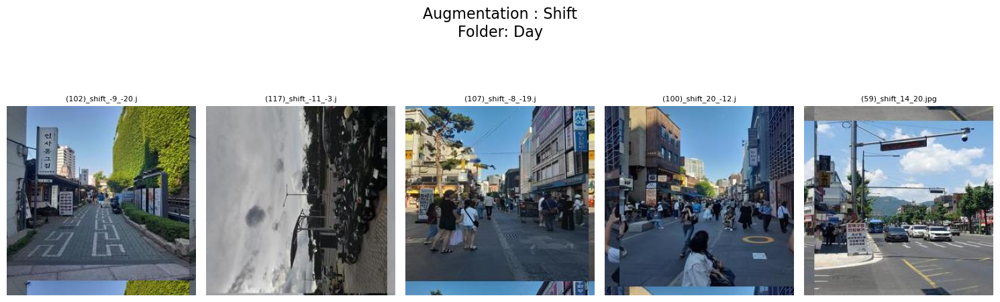

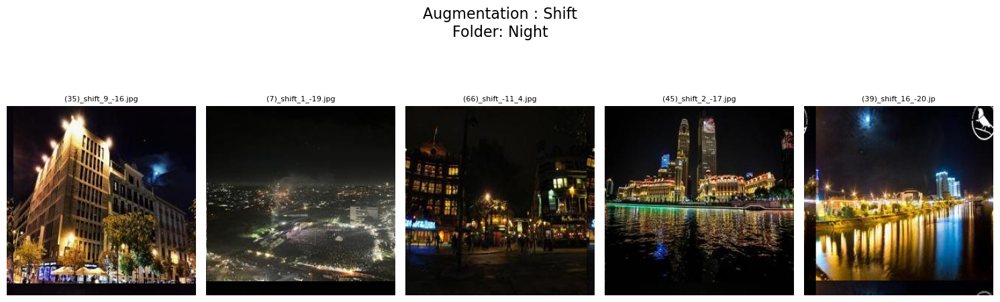

In [ ]:
visualize_augmentations(output_day_aug, "shift", num_samples=5)
visualize_augmentations(output_night_aug, "shift", num_samples=5)

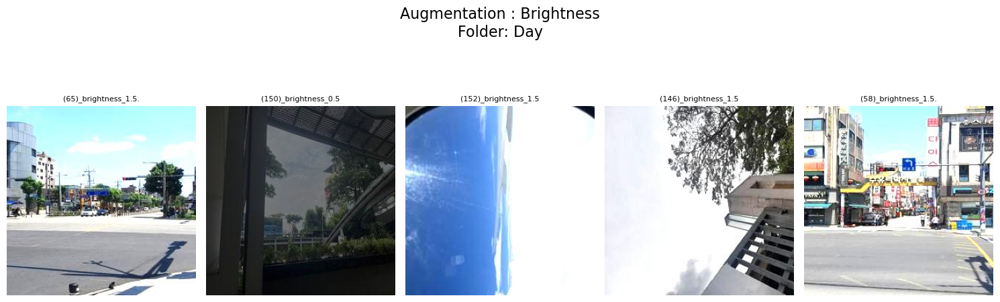

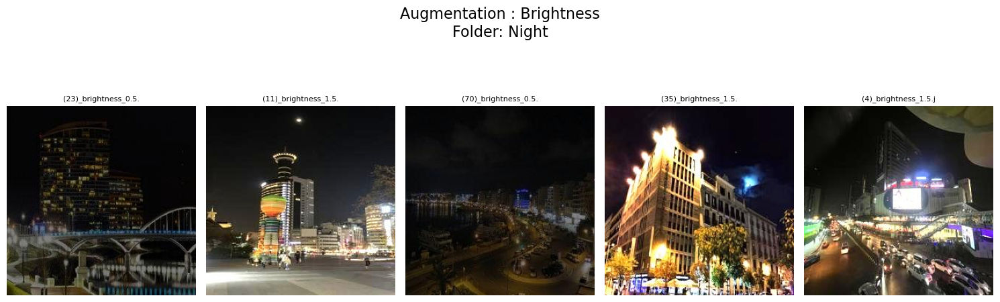

In [ ]:
visualize_augmentations(output_day_aug, "brightness", num_samples=5)
visualize_augmentations(output_night_aug, "brightness", num_samples=5)

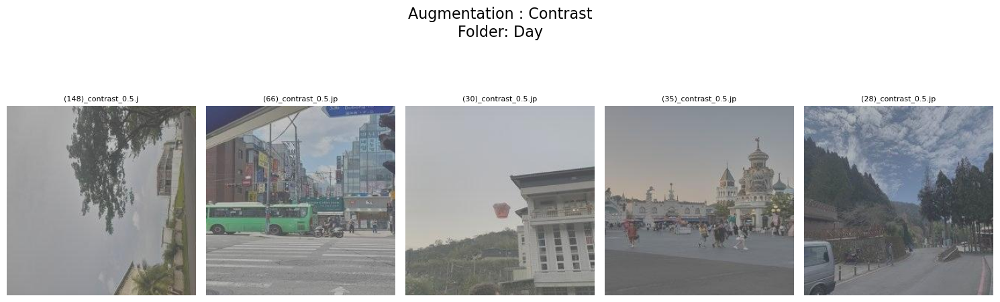

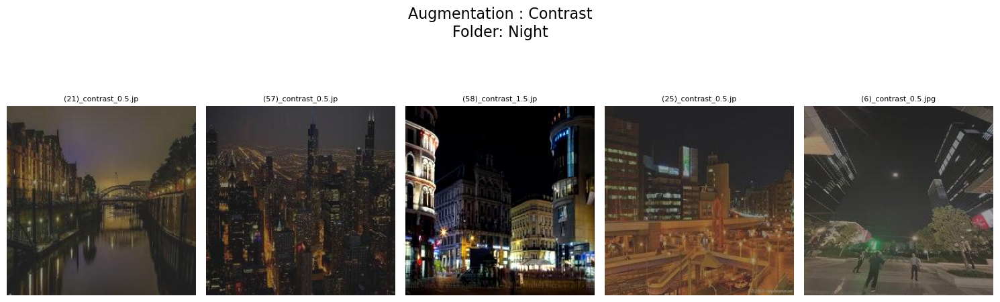

In [ ]:
visualize_augmentations(output_day_aug, "contrast", num_samples=5)
visualize_augmentations(output_night_aug, "contrast", num_samples=5)

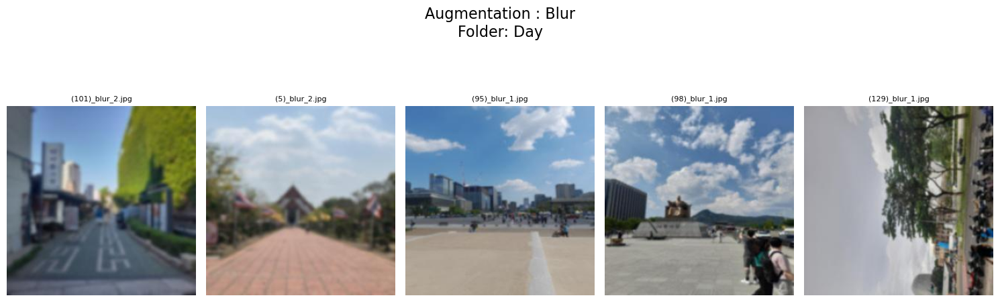

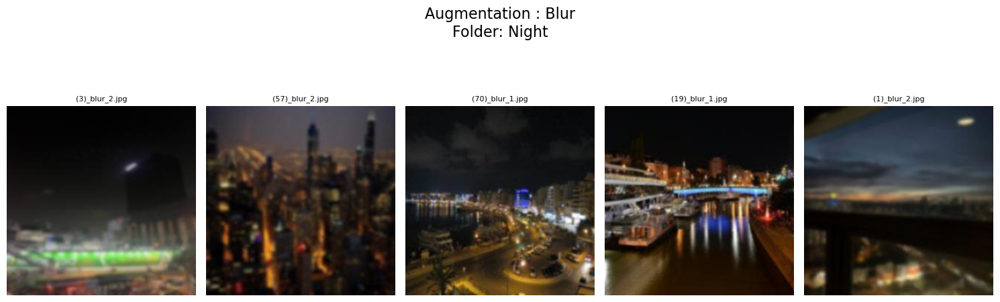

In [ ]:
visualize_augmentations(output_day_aug, "blur", num_samples=5)
visualize_augmentations(output_night_aug, "blur", num_samples=5)

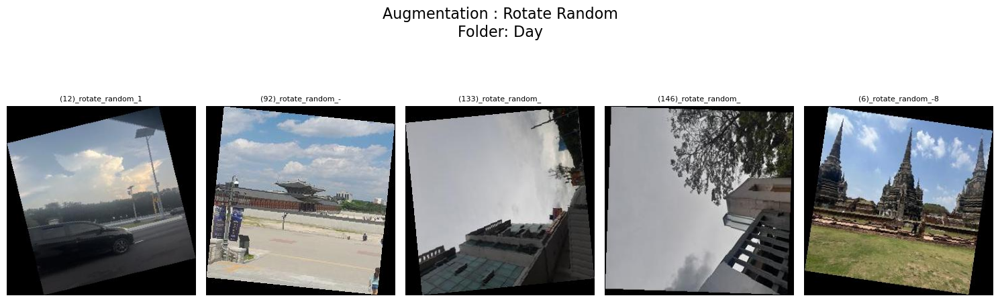

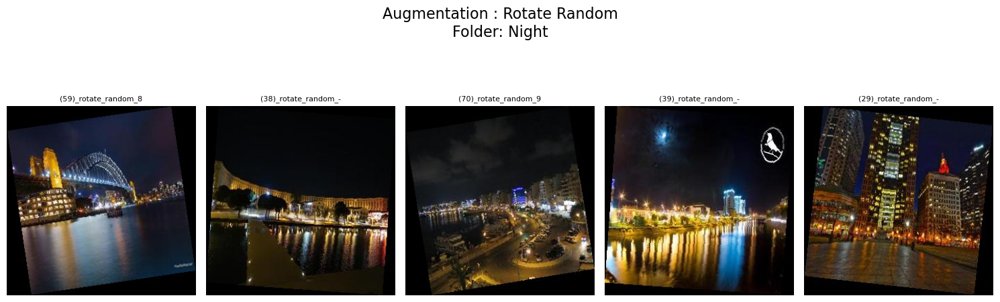

In [ ]:
visualize_augmentations(output_day_aug, "rotate_random", num_samples=5)
visualize_augmentations(output_night_aug, "rotate_random", num_samples=5)

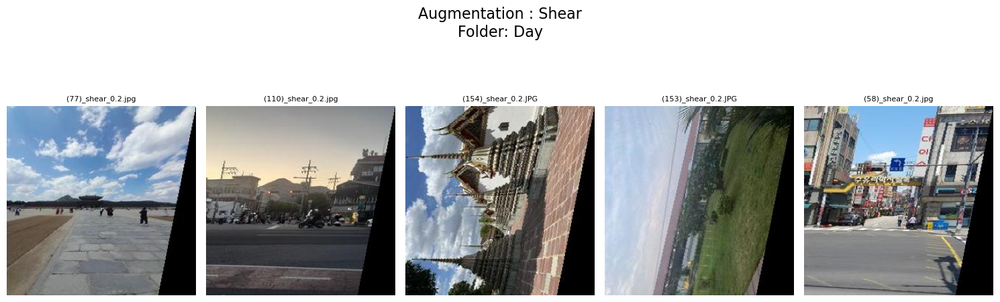

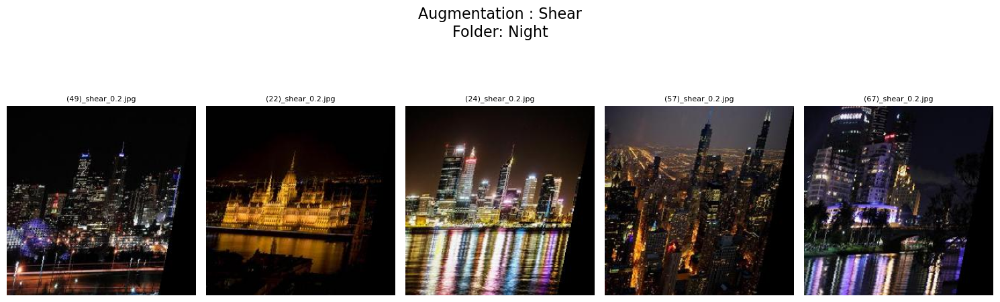

In [ ]:
visualize_augmentations(output_day_aug, "shear", num_samples=5)
visualize_augmentations(output_night_aug, "shear", num_samples=5)

In [ ]:
def getImagePaths(path):
    image_names = []
    for dirname, _, filenames in os.walk(path):
        for filename in filenames:
            fullpath = os.path.join(dirname, filename)
            image_names.append(fullpath)
    return image_names

day_images_path = getImagePaths(day_Resized)
night_images_path = getImagePaths(night_Resized)
day_augmentation_path = getImagePaths(output_day_aug)
night_augmentation_path = getImagePaths(output_night_aug)

print(f"Number of Day images                : {len(day_images_path)}")
print(f"Number of Night images              : {len(night_images_path)}")
print(f"Number of Day augmentation images   : {len(day_augmentation_path)}")
print(f"Number of Night augmentation images : {len(night_augmentation_path)}")

Number of Day images                : 159
Number of Night images              : 70
Number of Day augmentation images   : 2067
Number of Night augmentation images : 910
